In [63]:
# !pip install statsmodels
# !pip install category_encoders
# !pip install tqdm

In [ ]:
import pandas as pd
pd.options.display.float_format = "{:,.2f}".format
import numpy as np

import sys
sys.path.append("../")

from src import soporte_outliers as so
from src import soporte_preprocesamiento as sp

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm

from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestRegressor

# Métodos estadísticos
# -----------------------------------------------------------------------
from scipy.stats import zscore # para calcular el z-score
from sklearn.neighbors import LocalOutlierFactor # para detectar outliers usando el método LOF
from sklearn.ensemble import IsolationForest # para detectar outliers usando el metodo IF
from sklearn.neighbors import NearestNeighbors # para calcular la epsilon

from itertools import product, combinations

In [65]:
df = pd.read_csv("../datos/output/df_sin_nulos_min_max.csv", index_col=0)
df.head()

,price,propertyType,operation,size,exterior,rooms,bathrooms,province,municipality,distance,status,newDevelopment,floor,district,hasLift,parkingSpace,size_MinMax,distance_MinMax
0,750.00,flat,rent,60.00,True,1,1,Madrid,Madrid,7037,good,False,3,Hortaleza,True,desconocido,0.22,0.12
1,750.00,flat,rent,70.00,True,2,1,Madrid,San Sebastián de los Reyes,16145,good,False,bj,Centro Urbano,False,desconocido,0.27,0.28
2,400.00,penthouse,rent,67.00,True,2,2,Madrid,Villamanrique de Tajo,55041,good,False,2,desconocido,False,desconocido,0.25,0.97
3,590.00,flat,rent,70.00,True,3,2,Madrid,Rascafría,56596,good,False,desconocido,desconocido,False,desconocido,0.27,1.00
4,684.00,studio,rent,45.00,True,0,1,Madrid,Madrid,10656,desconocido,desconocido,desconocido,desconocido,desconocido,desconocido,0.13,0.19


In [66]:
df["rooms"]=df["rooms"].astype("O")
df["bathrooms"]=df["bathrooms"].astype("O")

In [67]:
df.head(2)

,price,propertyType,operation,size,exterior,rooms,bathrooms,province,municipality,distance,status,newDevelopment,floor,district,hasLift,parkingSpace,size_MinMax,distance_MinMax
0,750.00,flat,rent,60.00,True,1,1,Madrid,Madrid,7037,good,False,3,Hortaleza,True,desconocido,0.22,0.12
1,750.00,flat,rent,70.00,True,2,1,Madrid,San Sebastián de los Reyes,16145,good,False,bj,Centro Urbano,False,desconocido,0.27,0.28


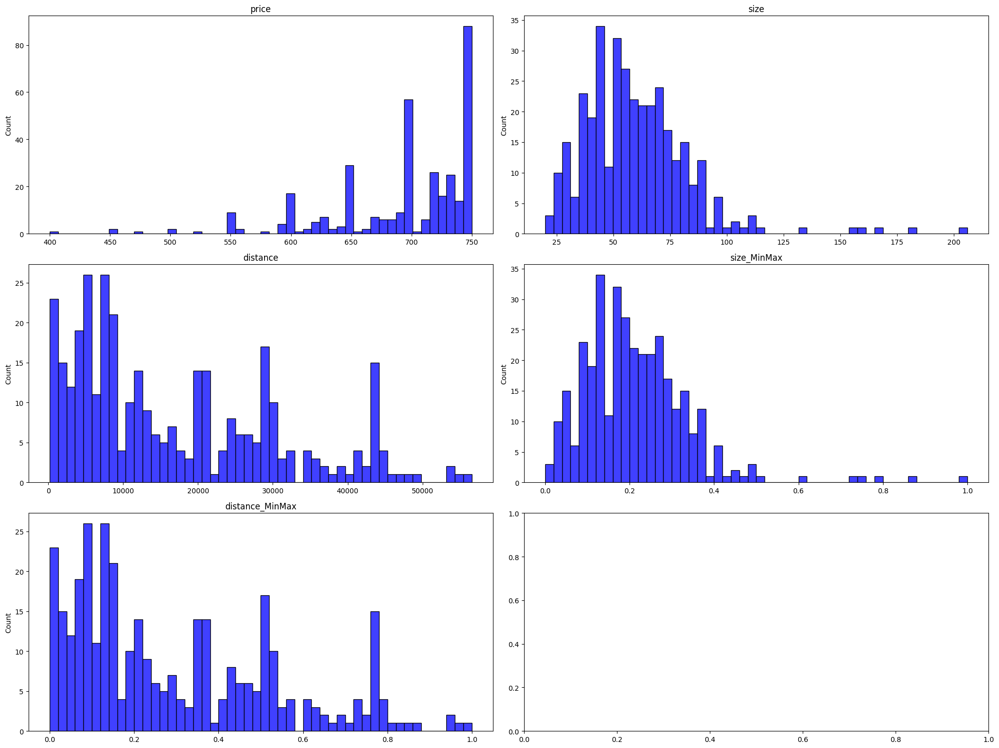

In [68]:
soporte = so.GestionOutliersUnivariados(df)
soporte.visualizar_outliers_univariados()

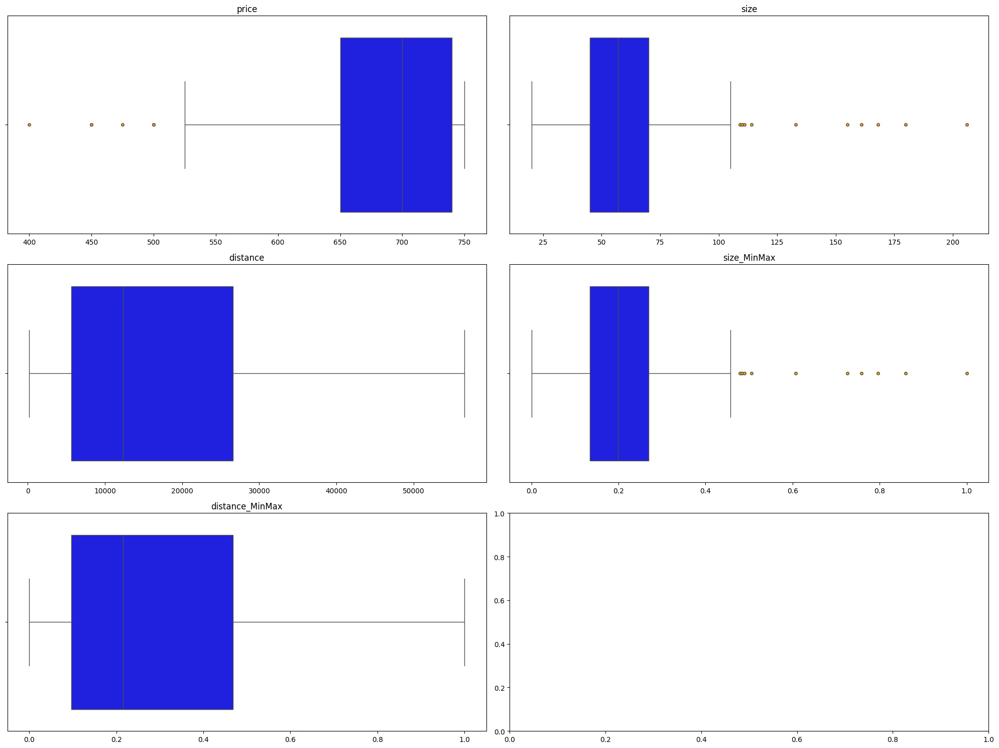

In [69]:
soporte.visualizar_outliers_univariados()

In [70]:
num=df.select_dtypes(include=np.number)
num.describe().T

,count,mean,std,min,25%,50%,75%,max
price,353.00,692.93,61.31,400.00,650.00,700.00,740.00,750.00
size,353.00,59.73,23.80,20.00,45.00,57.00,70.00,206.00
distance,353.00,"16,698.82","13,549.50",183.00,"5,656.00","12,321.00","26,558.00","56,596.00"
size_MinMax,353.00,0.21,0.13,0.00,0.13,0.20,0.27,1.00
distance_MinMax,353.00,0.29,0.24,0.00,0.10,0.22,0.47,1.00


In [71]:
soporte.detectar_outliers_z_score()

La cantidad de outliers que tenemos para la columna PRICE es  6
La cantidad de outliers que tenemos para la columna SIZE es  6
La cantidad de outliers que tenemos para la columna DISTANCE es  0
La cantidad de outliers que tenemos para la columna SIZE_MINMAX es  6
La cantidad de outliers que tenemos para la columna DISTANCE_MINMAX es  0


{'price':      price propertyType operation  size  exterior rooms bathrooms province  \
 2   400.00    penthouse      rent 67.00      True     2         2   Madrid   
 47  500.00       studio      rent 28.00     False     0         1   Madrid   
 94  500.00         flat      rent 45.00      True     1         1   Madrid   
 186 450.00    penthouse      rent 60.00      True     1         1   Madrid   
 241 475.00         flat      rent 79.00      True     2         2   Madrid   
 339 450.00         flat      rent 40.00      True     1         1   Madrid   
 
               municipality  distance status newDevelopment        floor  \
 2    Villamanrique de Tajo     55041   good          False            2   
 47                  Madrid       769   good          False            1   
 94            Valdemorillo     32188   good          False  desconocido   
 186        Villa del Prado     53238   good          False  desconocido   
 241           Navalafuente     45077   good          Fa

In [72]:
soporte.detectar_outliers_iqr()

La cantidad de outliers que tenemos para la columna PRICE es 6
La cantidad de outliers que tenemos para la columna SIZE es 11
La cantidad de outliers que tenemos para la columna SIZE_MINMAX es 11


{'price':      price propertyType operation  size  exterior rooms bathrooms province  \
 2   400.00    penthouse      rent 67.00      True     2         2   Madrid   
 47  500.00       studio      rent 28.00     False     0         1   Madrid   
 94  500.00         flat      rent 45.00      True     1         1   Madrid   
 186 450.00    penthouse      rent 60.00      True     1         1   Madrid   
 241 475.00         flat      rent 79.00      True     2         2   Madrid   
 339 450.00         flat      rent 40.00      True     1         1   Madrid   
 
               municipality  distance status newDevelopment        floor  \
 2    Villamanrique de Tajo     55041   good          False            2   
 47                  Madrid       769   good          False            1   
 94            Valdemorillo     32188   good          False  desconocido   
 186        Villa del Prado     53238   good          False  desconocido   
 241           Navalafuente     45077   good          Fa

In [73]:
contaminacion= [0.01, 0.05, 0.1]
estimadores = [100, 400, 1000, 2000]
combinaciones = list(product(contaminacion, estimadores))
for cont, esti in combinaciones:
    
    ifo=IsolationForest(random_state=42,
                        n_estimators=esti,
                        contamination=cont,
                        n_jobs=-1)

    df[f"outliers_ifo_{cont}_{esti}"]=ifo.fit_predict(df[["price", "size_MinMax", "distance_MinMax"]]) 

In [74]:
columnas_outliers=df.filter(like="outliers")

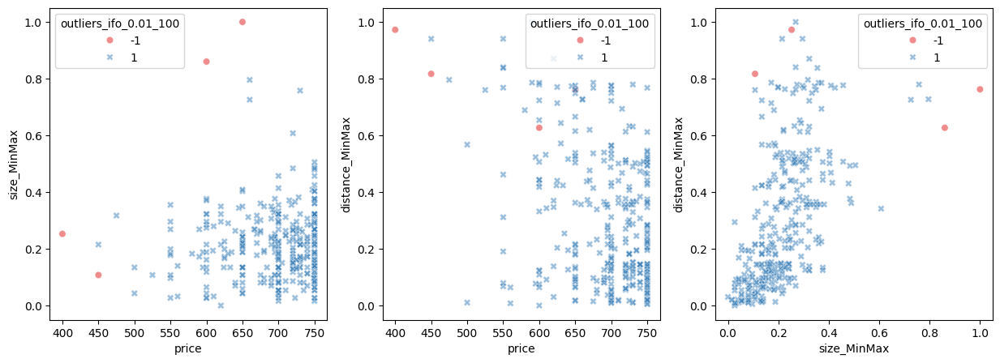

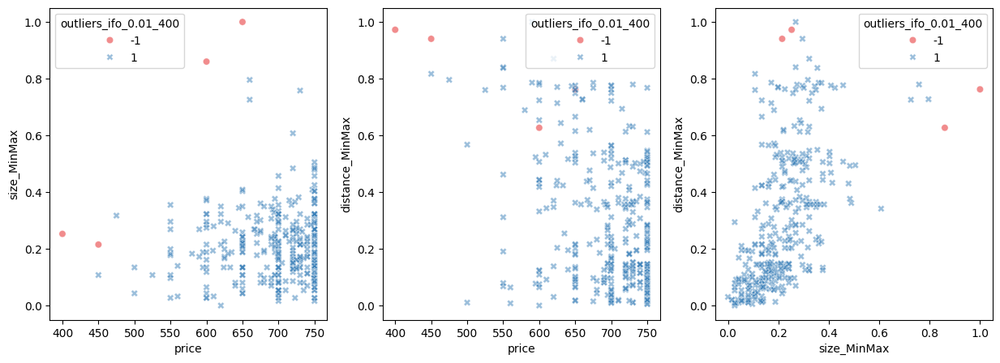

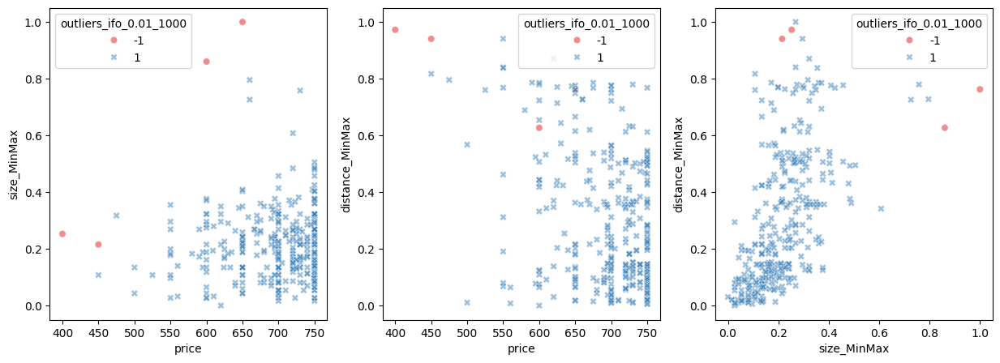

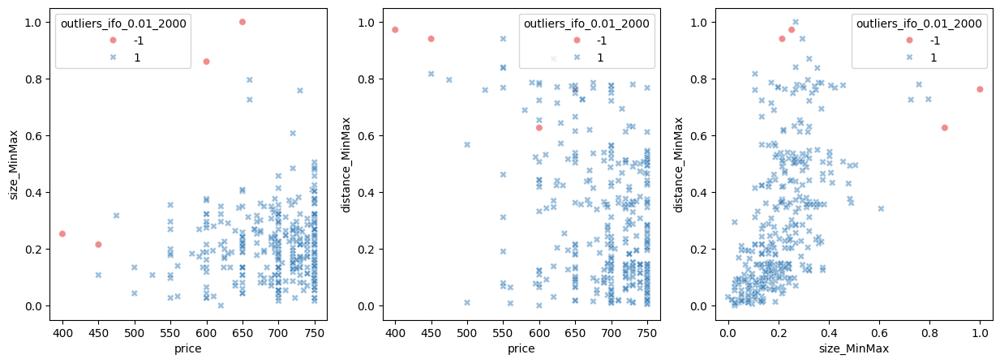

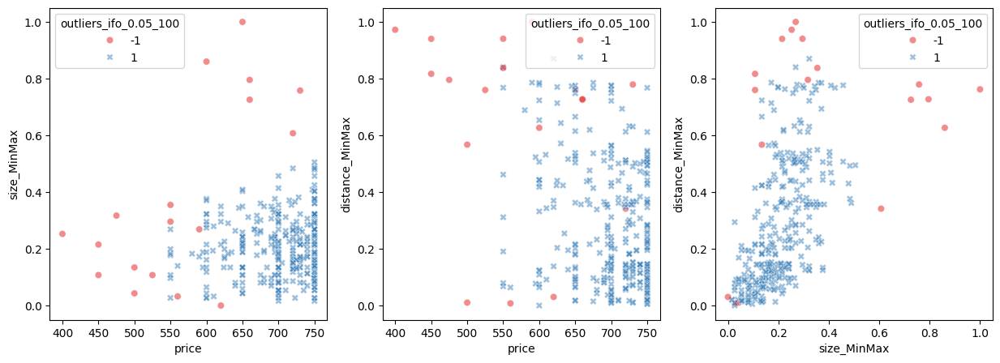

...

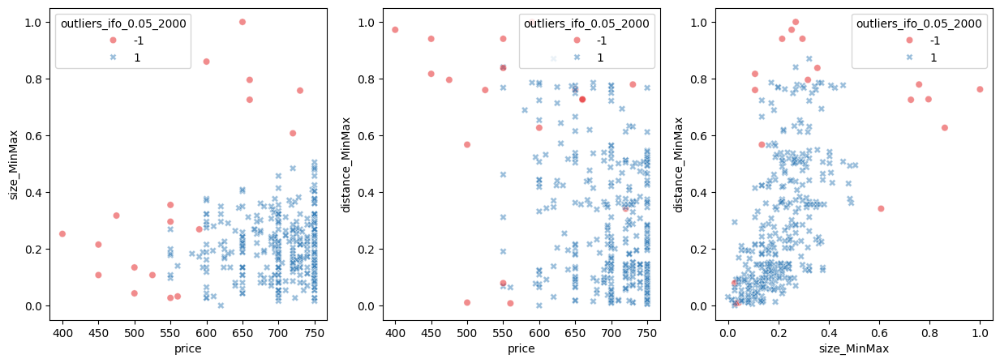

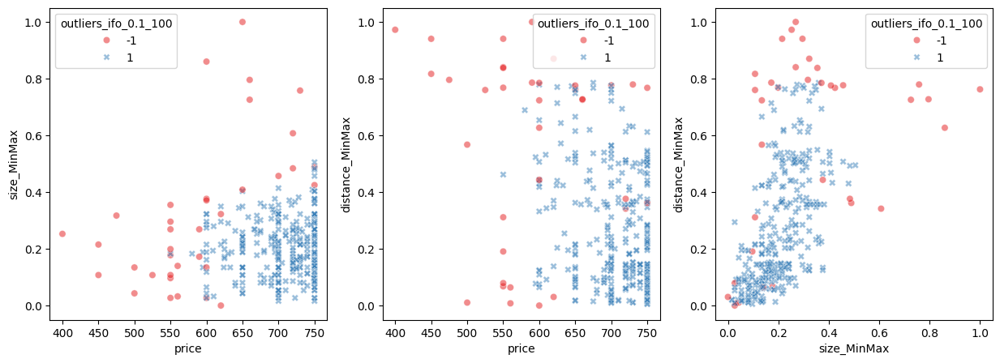

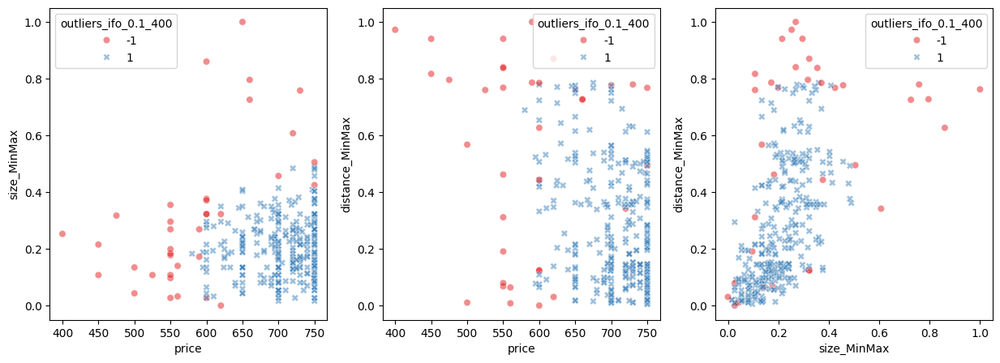

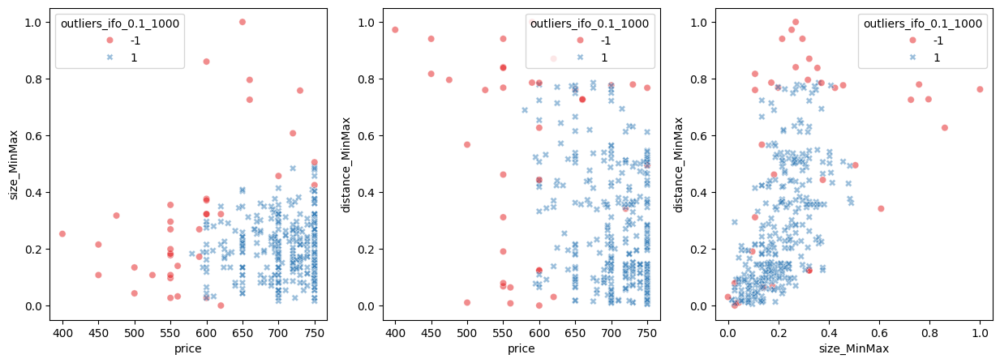

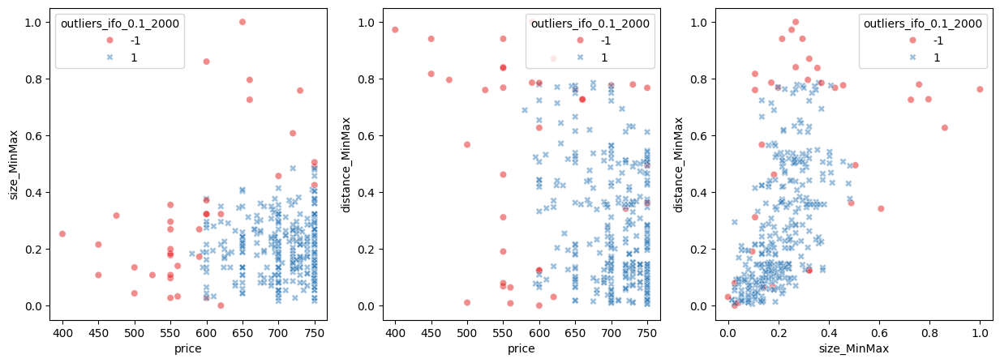

In [75]:
combinaciones = list(combinations(["price", "size_MinMax", "distance_MinMax"], 2))
for columna in columnas_outliers:
    fig, axes = plt.subplots(nrows=1,ncols=3, figsize=(15,5))
    axes=axes.flat
    for indice, tupla in enumerate(combinaciones):
        sns.scatterplot(x=tupla[0], y=tupla[1], ax=axes[indice], data=df, hue=columna, palette= "Set1", alpha= 0.5, style=columna)

In [76]:
lista_contaminaciones = [0.01, 0.05, 0.1]
lista_neighbors = [20, 35, 50]

combinaciones = list(product(lista_contaminaciones, lista_neighbors))

for cont, neighbors in tqdm(combinaciones):
    lof = LocalOutlierFactor(n_neighbors=neighbors,
                            contamination=cont,
                            n_jobs=-1)

    df[f"outliers_lof_{cont}_{neighbors}"] = lof.fit_predict(df[["price", "size_MinMax", "distance_MinMax"]])
df

100%|██████████| 9/9 [00:00<00:00, 51.98it/s]


,price,propertyType,operation,size,exterior,rooms,bathrooms,province,municipality,distance,...,outliers_ifo_0.1_2000,outliers_lof_0.01_20,outliers_lof_0.01_35,outliers_lof_0.01_50,outliers_lof_0.05_20,outliers_lof_0.05_35,outliers_lof_0.05_50,outliers_lof_0.1_20,outliers_lof_0.1_35,outliers_lof_0.1_50
0,750.00,flat,rent,60.00,True,1,1,Madrid,Madrid,7037,...,1,1,1,1,1,1,1,1,1,1
1,750.00,flat,rent,70.00,True,2,1,Madrid,San Sebastián de los Reyes,16145,...,1,1,1,1,1,1,1,1,1,1
2,400.00,penthouse,rent,67.00,True,2,2,Madrid,Villamanrique de Tajo,55041,...,-1,1,1,1,1,1,-1,1,1,-1
3,590.00,flat,rent,70.00,True,3,2,Madrid,Rascafría,56596,...,-1,1,1,1,1,1,1,1,1,1
4,684.00,studio,rent,45.00,True,0,1,Madrid,Madrid,10656,...,1,1,1,1,1,1,1,1,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348,640.00,flat,rent,69.00,True,2,1,Madrid,Villalbilla,29311,...,1,1,1,1,-1,1,1,-1,1,1
349,700.00,flat,rent,54.00,True,1,1,Madrid,Getafe,11656,...,1,1,1,1,1,1,1,1,1,1
350,700.00,flat,rent,59.00,True,1,1,Madrid,Madrid,7529,...,1,1,1,1,1,1,1,1,1,1
351,700.00,flat,rent,75.00,True,2,1,Madrid,Alcalá de Henares,30359,...,1,1,1,1,1,1,1,1,1,1


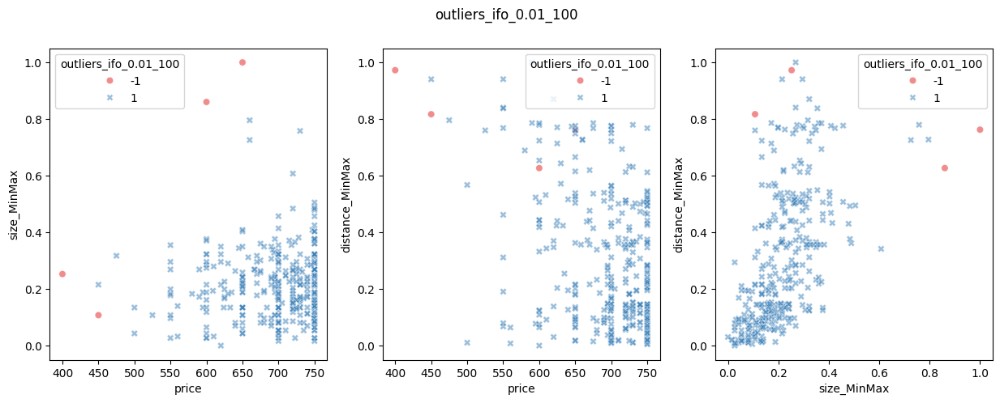

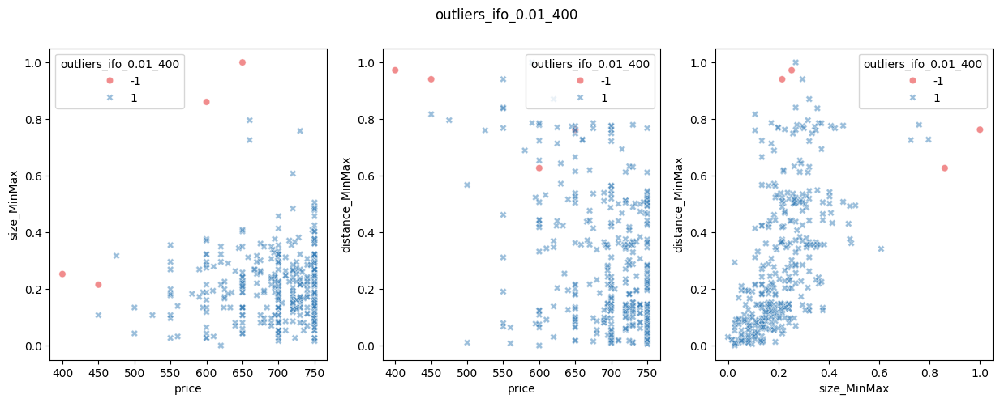

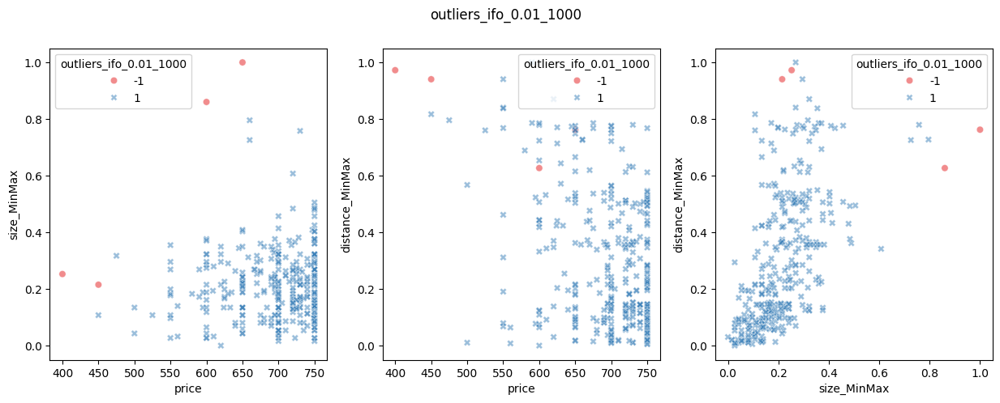

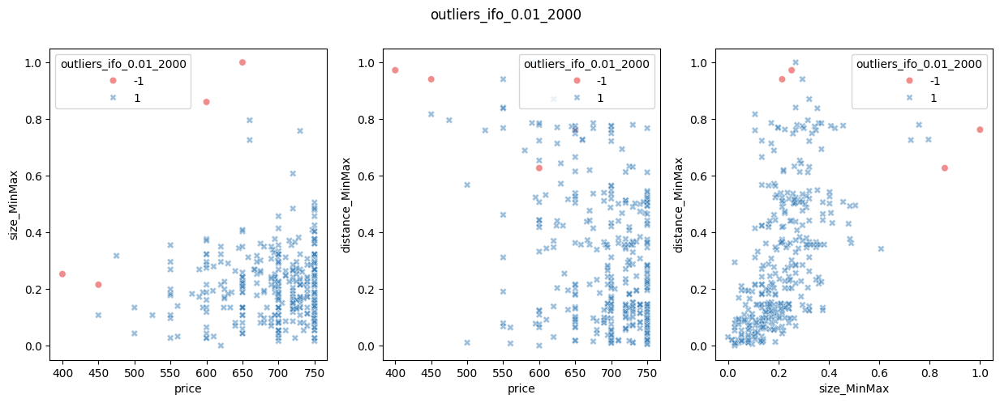

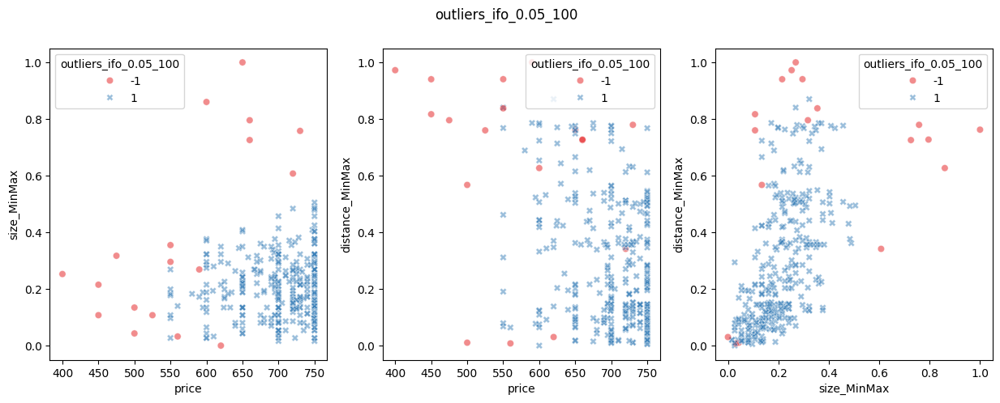

...

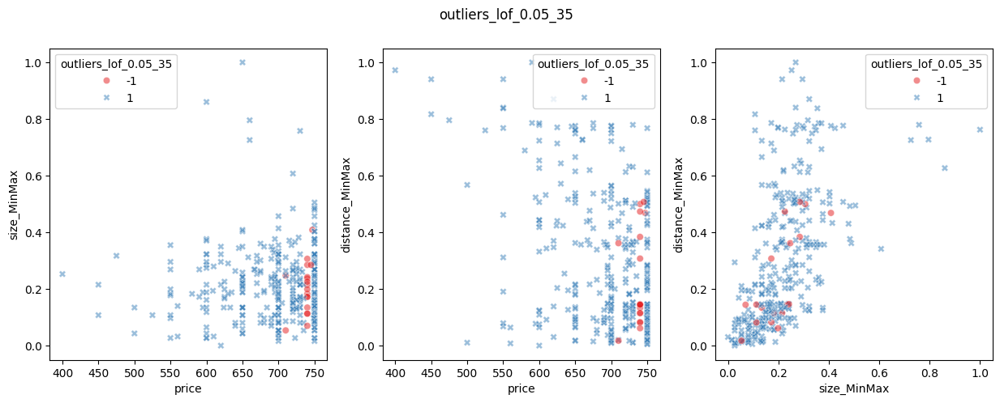

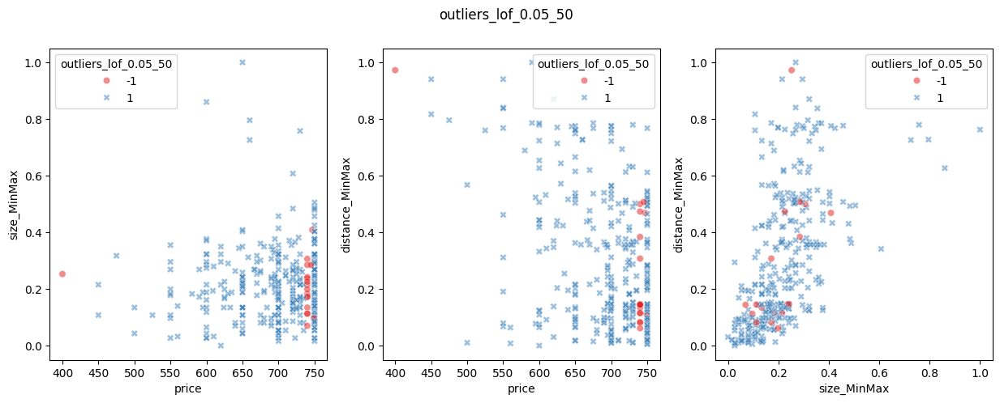

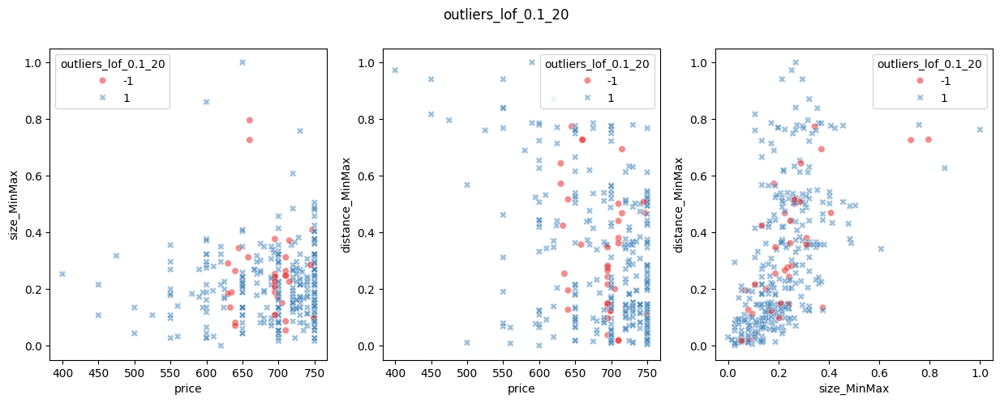

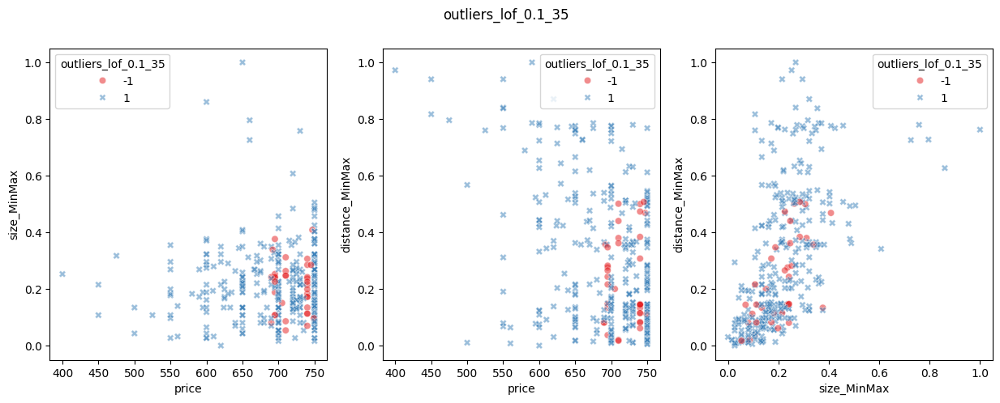

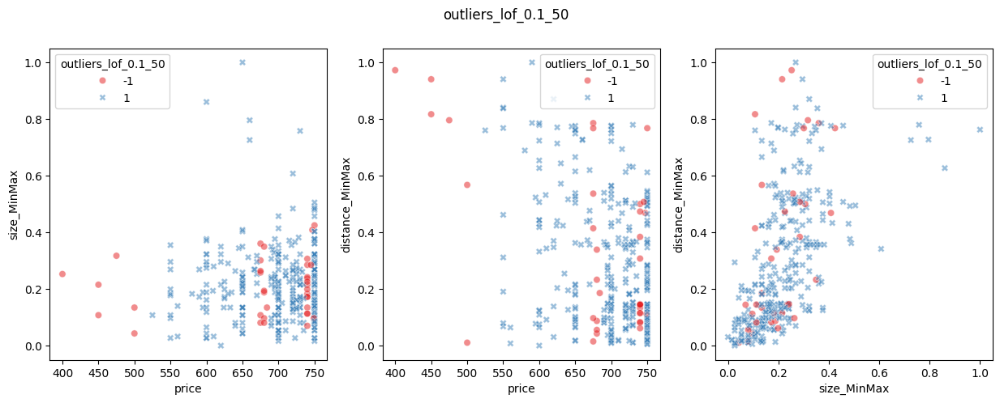

In [77]:
columnas_outliers = df.filter(like="outlier").columns

combinaciones_viz = list(combinations(["price", "size_MinMax", "distance_MinMax"], 2))
combinaciones_viz

for outlier in columnas_outliers:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (15, 5))
    axes = axes.flat

    for indice, tupla in enumerate(combinaciones_viz):
        sns.scatterplot(x = tupla[0],
                        y = tupla[1],
                        ax = axes[indice],
                        data = df,
                        hue=outlier,
                        palette="Set1",
                        style=outlier,
                        alpha=0.5)
        
    plt.suptitle(outlier)

In [78]:
columnas_outliers = df.filter(like="outliers").columns

In [79]:
df_outliers_100 = df[(df[columnas_outliers] == -1).all(axis=1)]

In [80]:
df.shape

(353, 39)

In [81]:
df.drop(df_outliers_100.index, inplace=True)
df.shape

(353, 39)

In [82]:
proporcion = 0.6 * len(columnas_outliers)
df_outliers_60_percent = df[df[columnas_outliers].eq(-1).sum(axis=1) >= proporcion]
df_outliers_60_percent

,price,propertyType,operation,size,exterior,rooms,bathrooms,province,municipality,distance,...,outliers_ifo_0.1_2000,outliers_lof_0.01_20,outliers_lof_0.01_35,outliers_lof_0.01_50,outliers_lof_0.05_20,outliers_lof_0.05_35,outliers_lof_0.05_50,outliers_lof_0.1_20,outliers_lof_0.1_35,outliers_lof_0.1_50
2,400.00,penthouse,rent,67.00,True,2,2,Madrid,Villamanrique de Tajo,55041,...,-1,1,1,1,1,1,-1,1,1,-1


In [83]:
#df_below_60_percent = df[df[columnas_outliers].eq(-1).sum(axis=1) < proporcion]
lista_cols = ["powerCV_robust", "kilometer_robust"]
for col in lista_cols:
    #median_value = df_below_60_percent[col].median()
    df_outliers_60_percent[col] = np.nan

In [84]:
# df.update(df_below_60_percent)

In [85]:
df_numericas=df.select_dtypes(include=np.number).drop(columns="price")
imputer_iterative= IterativeImputer()
iterative_imputer = imputer_iterative.fit_transform(df_numericas)
df_iterative = df.copy()
df_num_sin_nulos = pd.DataFrame(iterative_imputer, columns = df_numericas.columns)
df_iterative[df_numericas.columns] = df_num_sin_nulos

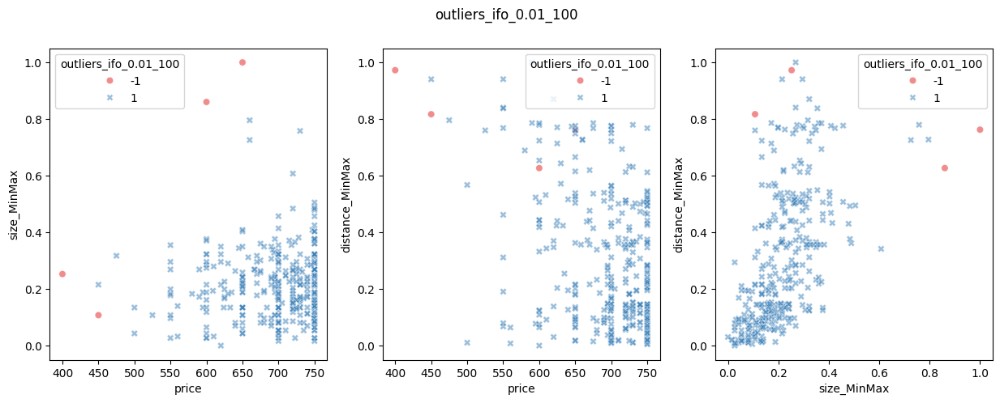

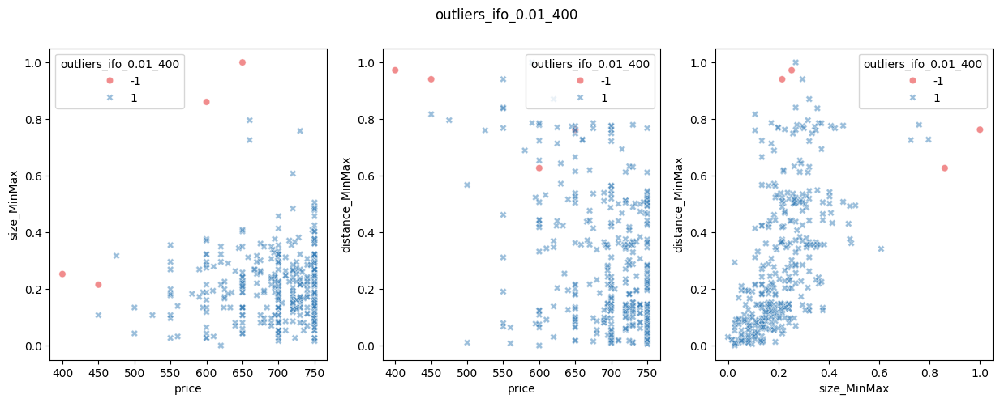

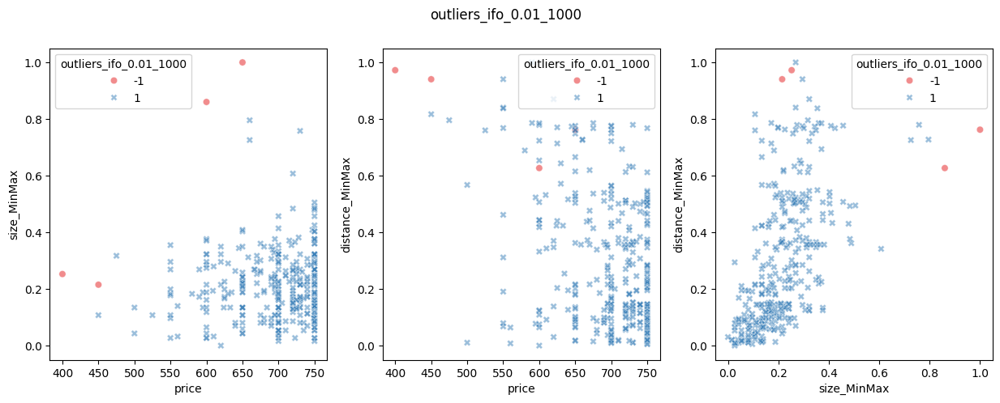

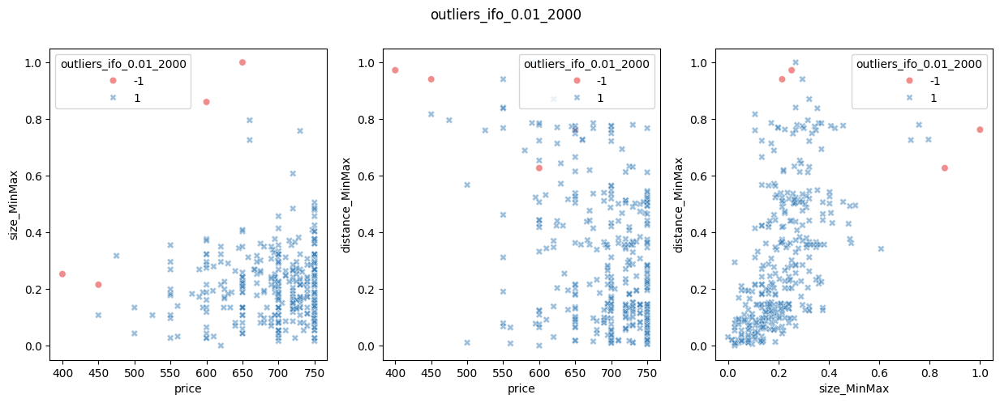

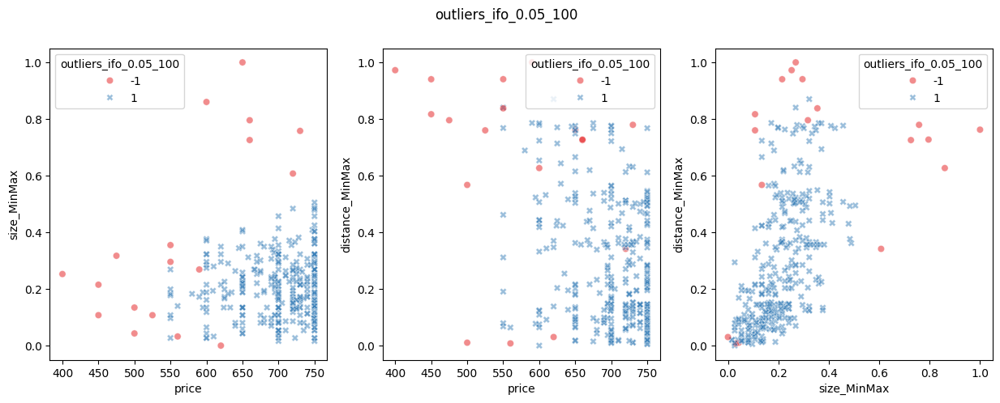

...

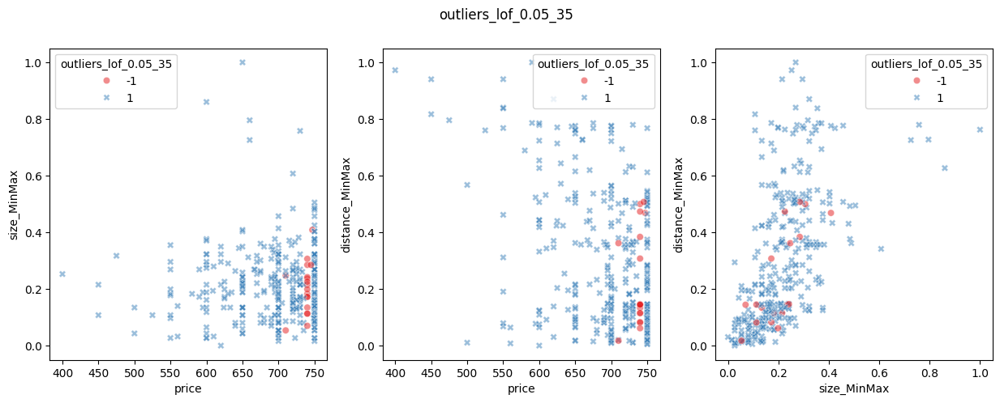

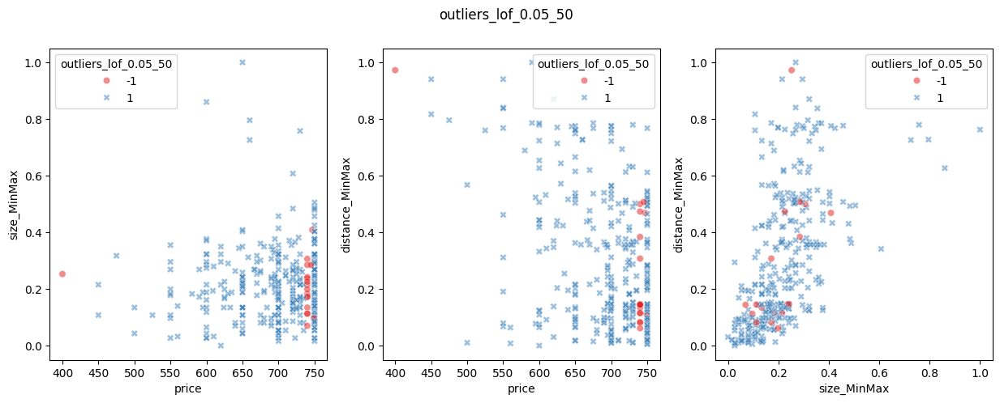

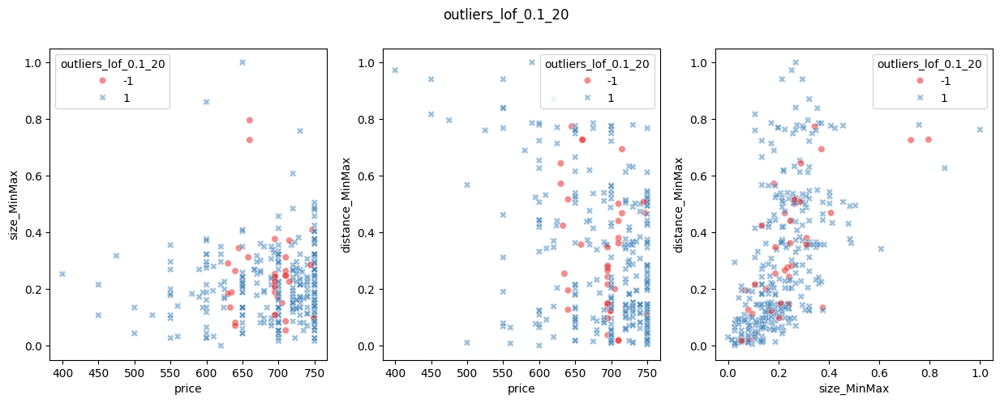

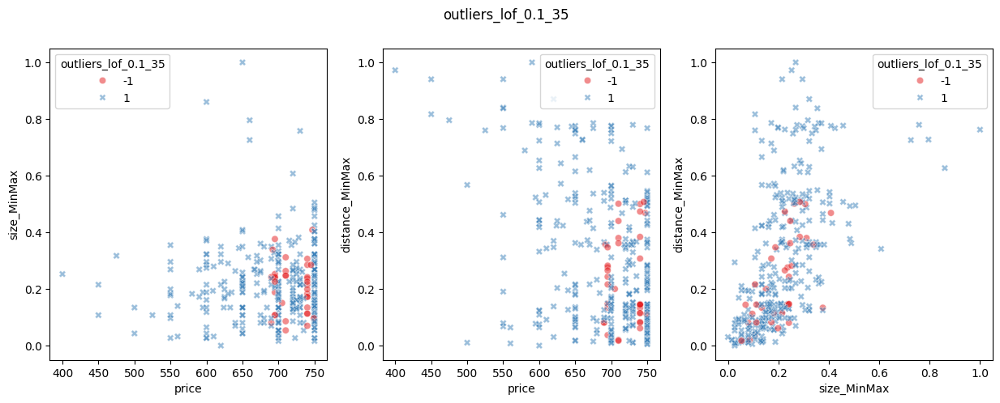

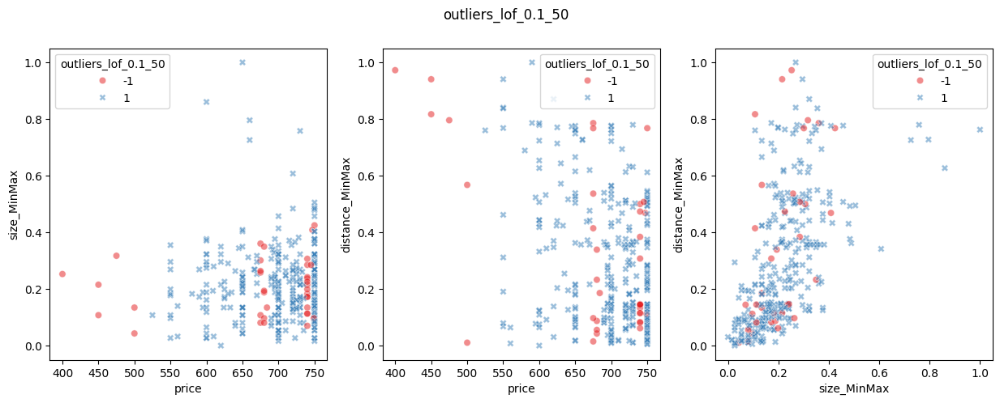

In [86]:
columnas_outliers = df.filter(like="outlier").columns

combinaciones_viz = list(combinations(["price", "size_MinMax", "distance_MinMax"], 2))
combinaciones_viz

for outlier in columnas_outliers:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (15, 5))
    axes = axes.flat

    for indice, tupla in enumerate(combinaciones_viz):
        sns.scatterplot(x = tupla[0],
                        y = tupla[1],
                        ax = axes[indice],
                        data = df,
                        hue=outlier,
                        palette="Set1",
                        style=outlier,
                        alpha=0.5)
        
    plt.suptitle(outlier)

In [87]:
df_iterative.isnull().sum()

price                     0
propertyType              0
operation                 0
size                      0
exterior                  0
rooms                     0
bathrooms                 0
province                  0
municipality              0
distance                  0
status                    0
newDevelopment            0
floor                     0
district                  0
hasLift                   0
parkingSpace              0
size_MinMax               0
distance_MinMax           0
outliers_ifo_0.01_100     0
outliers_ifo_0.01_400     0
outliers_ifo_0.01_1000    0
outliers_ifo_0.01_2000    0
outliers_ifo_0.05_100     0
outliers_ifo_0.05_400     0
outliers_ifo_0.05_1000    0
outliers_ifo_0.05_2000    0
outliers_ifo_0.1_100      0
outliers_ifo_0.1_400      0
outliers_ifo_0.1_1000     0
outliers_ifo_0.1_2000     0
outliers_lof_0.01_20      0
outliers_lof_0.01_35      0
outliers_lof_0.01_50      0
outliers_lof_0.05_20      0
outliers_lof_0.05_35      0
outliers_lof_0.05_50

In [89]:
df_iterative.to_csv("../datos/output/df_sin_nulos_min_max_iterative.csv")